# Исследование рынка заведений общественного питания города Москвы

В распоряжении есть данные о заведениях общественного питания города Москвы, включая сведения о наименовании места, графике работы, расположении места, среднем чеке и рейтинге, полученные из сервисов Яндекс Карты и Яндекс Бизнес.

**Цель исследования:**  проанализировать рынок заведений общественного питания и оценить возможность открытия кофейни

Для достижения цели исследования необходимо выполнить ряд задач:
- оценить полученные исходные данные, устранить (при необходимости) пропущенные значения, дубликаты, привести данные к необходимому для работы формату, добавить дополнительные признаки, необходимые для дальнейшей работы;
- оценить характеристики заведений общественного питания;
- проанализировать рынок кофеен города, сформулировать рекомендации по открытию новой точки;
- сформировать презентацию решения.

In [3]:
#загрузка библиотек для работы
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px

import folium

from folium import Map, Marker

from folium.plugins import MarkerCluster

from folium import Map, Choropleth

from IPython.display import display_html
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 30)
pd.set_option("display.float_format", "{:.2f}".format)

### Первичная оценка и подготовка данных 

Перед началом анализа, оценим содержимое полученного набора данных и определим, необходимо ли реализовать операции по предварительной обработке

In [4]:
#чтение файла с данными
ms=pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
ms.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [9]:
#получение общей информации о данных
ms.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [10]:
#проверка наличия пропусков
ms.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [11]:
#проверка наличия дубликатов
ms.duplicated().sum()

0

1) Всего было получено 8406 записей о заведениях Москвы, включающих сведения о наименовании места, его категории, адресе с координатами, часах работы, рейтинге по мнению пользователей, среднем чеке, отношении заведения к сетевым, количестве посадочных мест.
2) В датасете нет дубликатов, однако содержится ряд пропусков. Причиной их появления можно считать тот факт, что данные на портале, откуда был выгружен датасет, заполняются пользователями и в ряде случаев у редакторов нет сведений по параметрам, либо их препочли не указывать.
3) Часть из пропусков невозможно обработать. Это пропуски о рабочих часах и количестве посадочных мест, так как данные параметры в каждом из заведений свои и даже по сетевым заведениям невозможно сделать достоверные выводы. 
Пропуски по ценовому сегменту, средней стоимости чашки кофе и среднему чеку невозможно заполнить из-за отсутствия статистических данных по показателям и их заполнение может исказить итоговые результаты.
Тип данных по столцам соответствует реальности.

### Предварительная обработка данных 

Проведем предварительную обработку данных, определим, есть ли неявные дубликаты в наборе данных, которые могли возникнуть при ручном вводе из-за различия в регистре, использовании букв "е" и "ё".
Также добавим дополнительные сведения о расположении заведений (улица расположения) и их режиме работы (круглосуточно или нет).

#### Оценка наличия неявных дубликатов

In [12]:
#обработка текстовых записей
ms['name'] = ms['name'].str.lower()
ms['address'] = ms['address'].str.lower()
ms['district'] = ms['district'].str.lower()
ms['avg_bill'] = ms['avg_bill'].str.lower()
ms['category']=ms['category'].str.lower()

In [13]:
ms['name'] = ms['name'].replace('ё', 'е')
ms['address'] = ms['address'].replace('ё', 'е')
ms['district'] = ms['district'].replace('ё', 'е')
ms['avg_bill'] = ms['avg_bill'].replace('ё', 'е')
ms['category']=ms['category'].replace('ё', 'е')

In [14]:
#проверка наличия дубликатов среди записей о заведениях (одинаковые названия и адрес)
ms[['name', 'address']].duplicated().sum()

4

In [15]:
#удаление дублирующихся значений
ms = ms.drop_duplicates(subset=['name', 'address'], keep='first')
ms[['name', 'address']].duplicated().sum()

0

После приведения всех записей к нижнему регистру и замене ё на е было обнаружено 4 дубликата, совпадающие по названию и адресу расположения. В дальнейшем были удалены все повторяющиеся записи, кроме первой.



#### Формирование столбцов с дополнительными признаками

Приступим к дальнейшим операциям. Для выделения улицы расположения заведения обратимся к записям об адресе расположения, которые оформлены по шаблону "город, улица, дом, корпус", то есть, каждая из записей представляет собой строку. Для выделения улицы возможно обратиться к 2 элементу строки.

In [16]:
#формирование столбца с названиями улиц из столбца с адресом
ms['street'] = ms['address'].str.split(', ').str[1]
ms.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица


In [17]:
ms.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
street                  0
dtype: int64

В новом столбце пропусков нет, выделить улицы удалось.

Для формирования столбца с режимом работы заведения необходимо, чтобы первый элемент строки о режиме работы имел значение "ежедневно, круглосуточно". Иначе следует присвоить логическое значение False.

In [18]:
#формирование столбца, отражающего, круглосуточно ли работает заведение
ms['is_24/7'] = ms['hours'].str.contains('ежедневно, круглосуточно')
ms.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False


In [19]:
ms.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
street                  0
is_24/7               535
dtype: int64

Пропуски в столбце 'is_24/7' связаны с пропусками в столбце о режиме работы, заполнить их не представляется возможным


#### Оценка выбросов в данных


Оценим выбросы в числовых данных. Проверим записи о числе посадочных мест, рейтинге заведения. Стоит оценить заполнение столбца о сетевой принадлежности заведения.

In [20]:
#оценка заполнения столбца со статусом заведения (должны быть значения 0 и 1)
ms['chain'].unique()

array([0, 1])

In [21]:
#оценка заполнения столбца со рейтингом заведения (должны быть значения 0 и 1)
ms['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

In [22]:
#оценка распределения числа посадочных мест
ms['seats'].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])

count   4792.00
mean     108.36
std      122.84
min        0.00
5%         6.00
25%       40.00
50%       75.00
75%      140.00
90%      240.00
95%      307.00
99%      625.00
max     1288.00
Name: seats, dtype: float64

Среди всех заведений очень выделяются заведения, в которых число посадочных мест свыше 307. Оценим, что это за заведения, так как такими большими площадями (вместимость свыше 600 мест) могут обладать разве что фудкорты или какие-то глобальные объекты

In [23]:
l=ms.loc[ms['seats']>600, ['name', 'category', 'address', 'seats']]
l

,name,category,address,seats
1326,нам,"бар,паб","москва, ленинградский проспект, 69, стр. 1",625.00
1351,максима пицца,пиццерия,"москва, ленинградский проспект, 78, корп. 1",625.00
1355,страдивари,ресторан,"москва, ленинградский проспект, 77, корп. 1",625.00
1367,академия,пиццерия,"москва, ленинградский проспект, 72, корп. 1",625.00
1380,север-метрополь,кофейня,"москва, ленинградский проспект, 75, корп. 1",625.00
1385,чайхона на соколе,кафе,"москва, ленинградский проспект, 69, стр. 1",625.00
1393,кулинарная лавка братьев караваевых,кафе,"москва, ленинградский проспект, 72, корп. 1",625.00
1442,abc coffee roasters,кофейня,"москва, ленинградский проспект, 72, корп. 1",625.00
1446,9 bar coffee,кофейня,"москва, ленинградский проспект, 80, корп. 1",625.00
1464,находка,ресторан,"москва, ленинградский проспект, 74, корп. 1",625.00


Анализ представленных заведений показал, что их площади (по данным из открытых источников) не предполагают размещение такого значительного количества гостей. возможно, при заполнении данных была допущена ошибка. Однако, сведения об этих заведениях представляют ценность при анализе распределения объектов по районам и улицам, представленным категориям, поэтому удаление данных может нанести ущерб результату. 
Поэтому данные было решено оставить в наборе, но при дальнейшем анализе учитывать, что в данных о числе посадочных мест присутствуют аномалии.

### Анализ данных

После завершения предварительной обработки приступим к изучению данных. 

#### Оценка распространенности заведений по категориям

In [24]:
#получение списка категорий
ms['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [25]:
#подсчет числа объектов в каждой из категорий
category = ms.pivot_table(index=['category'], values='address', aggfunc='count').sort_values(by = 'address', ascending=False)
category.columns= ['count']
category

,count
category,
кафе,2376
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


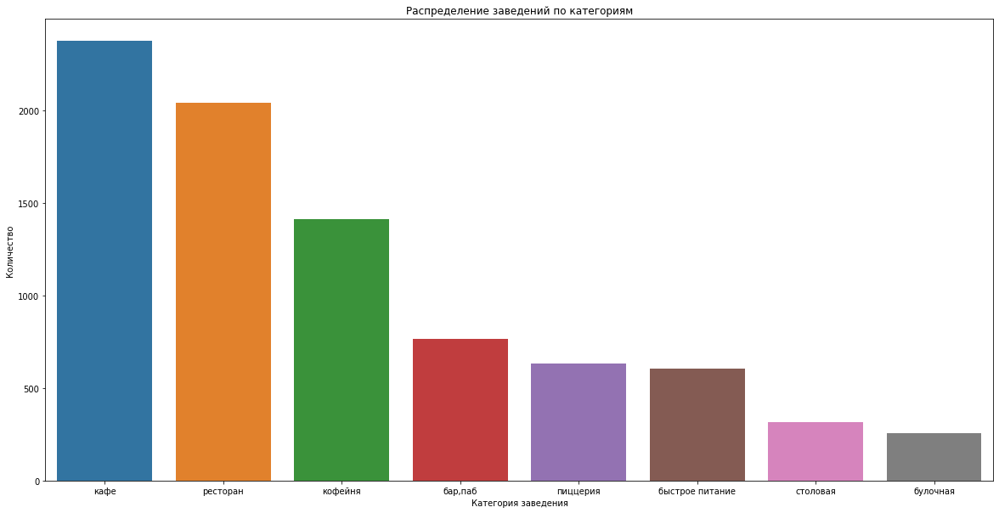

In [31]:
#вывод диаграммы для оценки распределения объектов по категориям

plt.figure(figsize=(20, 10))
sns.barplot(x=category.index, y='count', data=category)

plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.title('Распределение заведений по категориям')

plt.show()

Всего в наборе данных представлены записи о заведениях 8 типов: кафе, ресторан, кофейня, пиццерия, бары и пабы, быстрое питание, булочная, столовая.
Наиболее широко на рынке представлены кафе и рестораны (их 28,3% и 24,3% соответственно). На третьем месте - кофейни. 
Заведения иных типов распространены значительно меньше, их доля на рынке не превышает 10%. 

Оценим, как располагаются заведения разных типов по городу с использованием тепловой карты

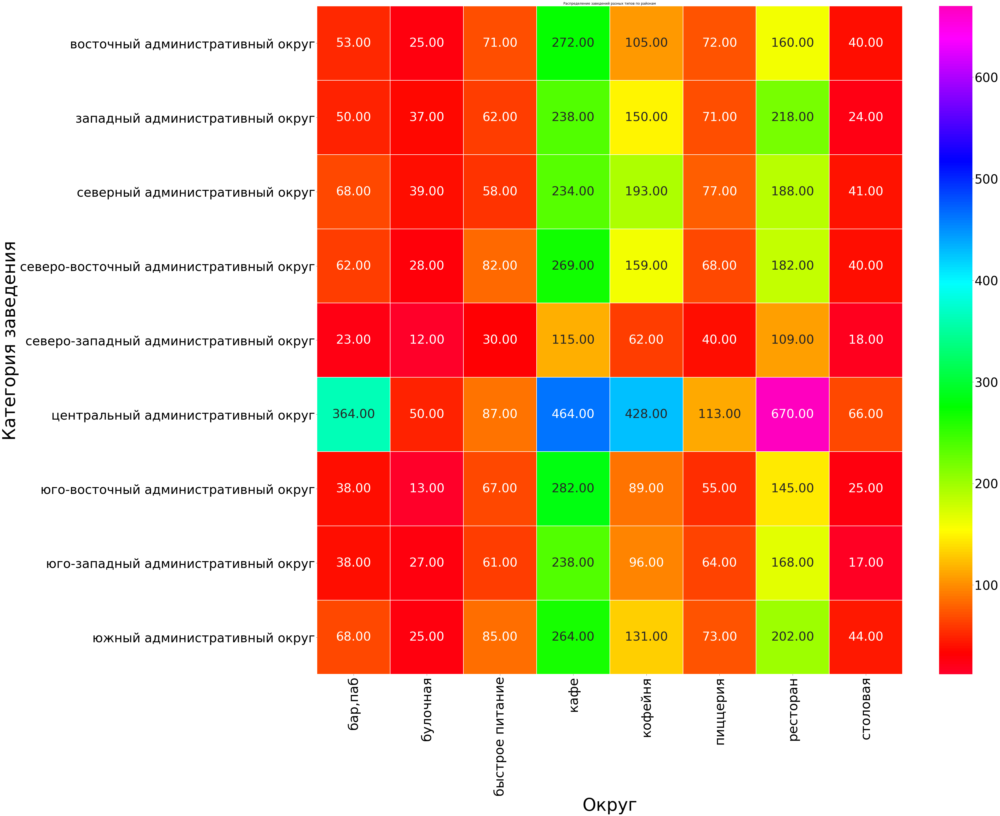

In [42]:
#формирование сводной таблицы для построения тепловой карты
ms_h = ms.pivot_table(index='district', columns='category', values='address', aggfunc='count')
#вывод тепловой карты
plt.figure(figsize=(48,45))
with plt.style.context({'axes.labelsize':64,
                        'xtick.labelsize':48,
                        'ytick.labelsize':46}):
    sns.heatmap(data=ms_h, 
            annot=True,
            fmt=".2f", 
            cmap="gist_rainbow",
            linewidth=1,
            annot_kws={'size': 45})
plt.xlabel('Округ')
plt.ylabel('Категория заведения')
plt.title('Распределение заведений разных типов по районам')
plt.show()


Как мы видим, большее число заведений располагается в центральном административном округе, в этом районе наблюдается максимальная концентрация ресторанов, кафе, кофеен и баров, причем, число заведений этих типов в данном районе значительно превышает число заведений по иным районам. Это связано с высокой популярностью района среди туристов, наличием большого числа офисных объектов. При открытии заведения в центральном районе есть риск не выдержать конкуренцию с действующими организациями.
Наименьшее число заведений в северо-западном административном округе.

#### Оценка числа посадочных мест по категориям

Так как по данному параметру в ходе предварительной обработки были идентифицированы аномально высокие значения, то при анализе произведем оценку для заведений, число посадочных мест в которых не превышает 500.

При оценке будем использовать тепловую карту для отображения числа посадочных мест в заведениях каждого из типов. При оценке используем такую статистику, как медианное значение, которое позволит минимизировать влияние выбросов на итоговые результаты

In [35]:
#получение среза данных
ms_seats=ms.query('seats<501')

In [36]:
#формирование сводной таблицы для построения тепловой карты
ms_s = ms_seats.pivot_table(index='category', columns='district', values='seats', aggfunc='median')
ms_s

district,восточный административный округ,западный административный округ,северный административный округ,северо-восточный административный округ,северо-западный административный округ,центральный административный округ,юго-восточный административный округ,юго-западный административный округ,южный административный округ
category,,,,,,,,,
"бар,паб",92.50,91.00,65.00,62.00,85.00,90.00,55.00,63.00,80.00
булочная,36.00,90.00,34.50,98.00,45.50,50.00,77.00,50.00,30.00
быстрое питание,38.00,100.00,51.50,60.00,80.00,94.50,50.00,75.00,83.00
кафе,48.00,60.00,48.00,60.00,95.00,84.00,58.00,70.00,45.00
кофейня,53.50,96.00,58.00,75.00,87.50,86.00,50.00,64.50,80.00
пиццерия,42.50,65.00,50.00,70.00,57.50,90.00,45.00,48.00,45.00
ресторан,60.00,98.50,80.00,80.00,92.00,100.00,70.00,70.00,93.50
столовая,72.00,44.00,49.00,48.00,60.00,100.00,95.00,68.00,80.00


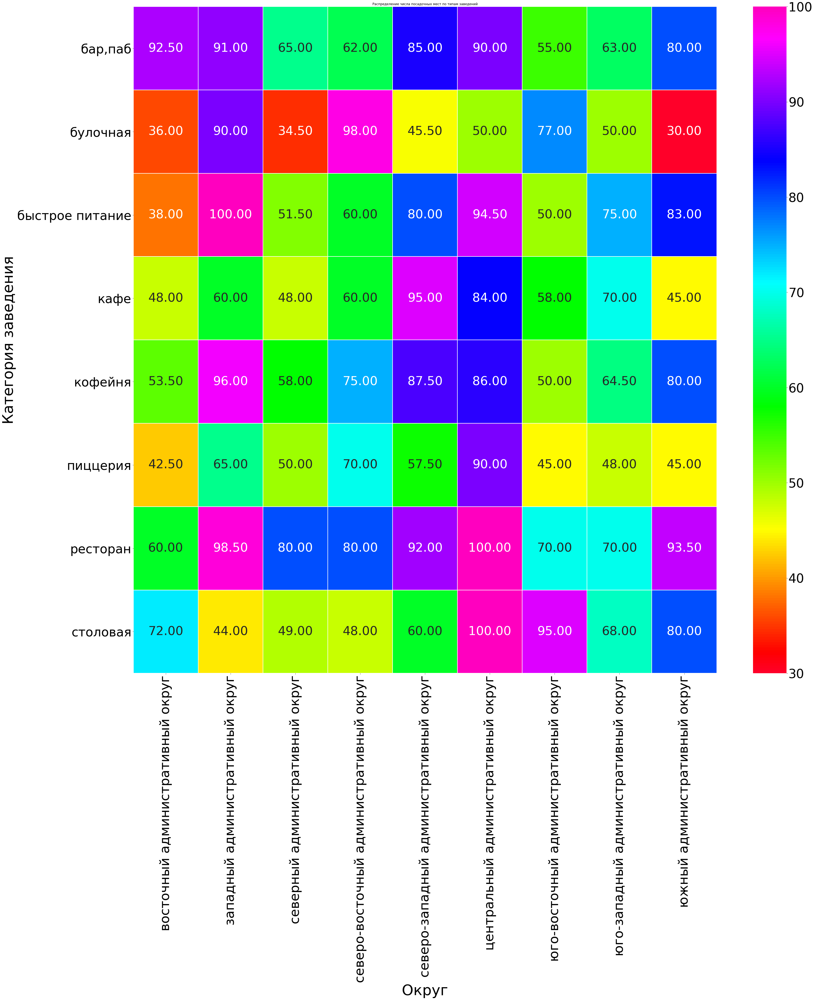

In [43]:
#вывод тепловой карты
plt.figure(figsize=(48,45))
with plt.style.context({'axes.labelsize':54,
                        'xtick.labelsize':48,
                        'ytick.labelsize':46}):
    sns.heatmap(data=ms_s, 
            annot=True,
            fmt=".2f", 
            cmap="gist_rainbow",
            linewidth=1,
            annot_kws={'size': 45})
plt.xlabel('Округ')
plt.ylabel('Категория заведения')
plt.title('Распределение числа посадочных мест по типам заведений')
plt.show()


Большее число посадочных мест в ресторанах, а также в барах. Число посадочных мест в заведениях центрального округа выше по всем категориям.
Если смотреть в среднем по городу, то самые маленькие площади занимают булочные.
Было отмечено, что в кофейнях медианно отмечается большое число посадочных мест, несмотря на то, что формат кофейни чаще всего предполагает малые площади и работу "на вынос". Возможно, это какие-то сетевые заведения, в стандартах которых прописано содержание большого зала.
Оценим дополнительно взаимосвязь между принадлежностью к сети.

In [38]:
#формирование сводной таблицы для построения тепловой карты
ms_s_c = ms_seats.pivot_table(index='category', columns='chain', values='seats', aggfunc='median')


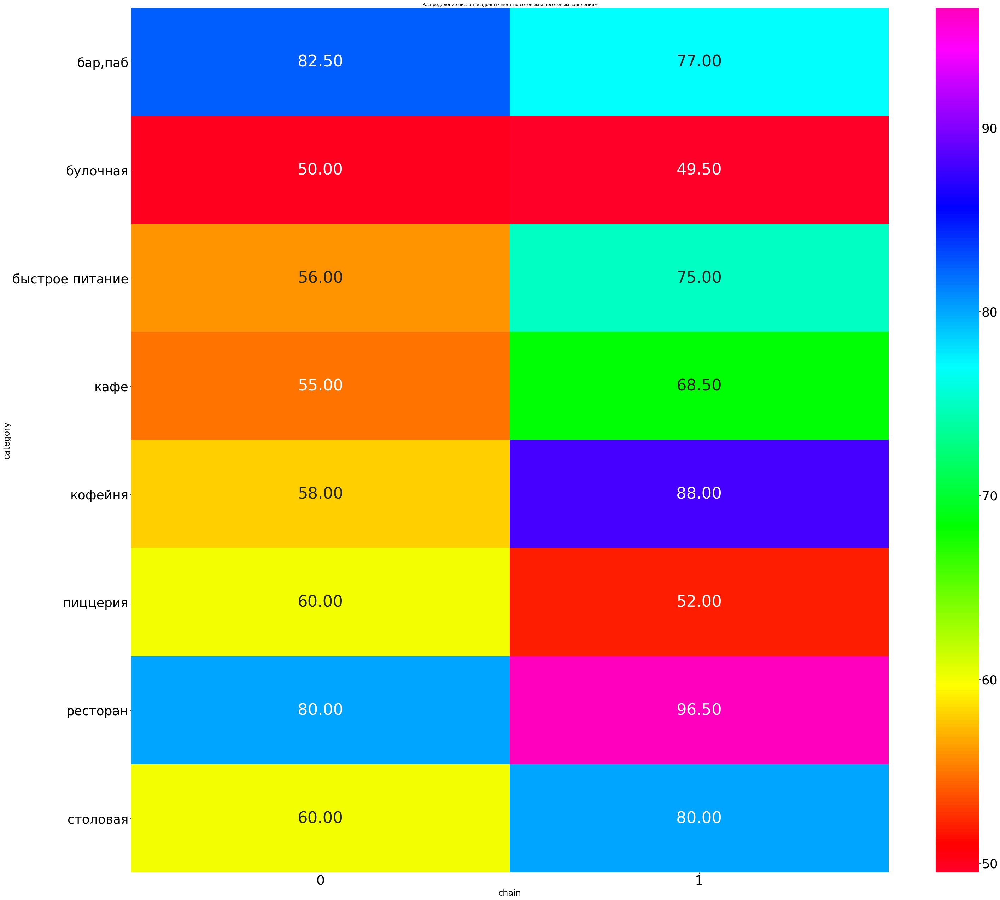

In [26]:
#вывод тепловой карты
plt.figure(figsize=(48,45))
with plt.style.context({'axes.labelsize':24,
                        'xtick.labelsize':38,
                        'ytick.labelsize':36}):
    sns.heatmap(data=ms_s_c, 
            annot=True,
            fmt=".2f", 
            cmap="gist_rainbow",
            linewidth=1,    
            annot_kws={'size': 45})
plt.xlabel('Принадлежность к сети')
plt.ylabel('Категория заведения')
plt.title('Распределение числа посадочных мест по сетевым и несетевым заведениям')
plt.show()


В сетевых заведениях отмечается большее число посадочных мест. Их содержание может быть оправдано известностью сети, за счет чего и обеспечивается оборот. Многие сети сочетают в себе как подачу кофе, так и приготовление блюд, поэтому по их формату следует держать большее число посадочных мест, чем у несетвых кофеен, ассортимент которых предполагает кофе и снеки.

#### Оценка числа сетевых и несетевых организаций

Посмотрим, насколько распространены сети по городу, каких типов заведений больше - сетевых или несетевых

In [27]:
#формирование сводной таблицы
ch=ms.pivot_table(index='chain', values='address', aggfunc='count')
ch.columns=['count']
ch

,count
chain,
0,5199
1,3203


In [28]:
#вывод круговой диаграммы для оценки доли сетей

fig = go.Figure(data=[go.Pie(labels=ch.index, values=ch['count'])])
fig.update_layout(title='Доля сетей')          
fig.show() 

In [29]:
#формирование сводной таблицы с разбивкой по типам заведений
ms_ch=ms.pivot_table(index='category', columns='chain', values='address', aggfunc='count', margins=True)
ms_ch.columns=['not_chain', 'chain', 'sum']
ms_ch

,not_chain,chain,sum
category,,,
"бар,паб",596,168,764
булочная,99,157,256
быстрое питание,371,232,603
кафе,1597,779,2376
кофейня,693,720,1413
пиццерия,303,330,633
ресторан,1313,729,2042
столовая,227,88,315
All,5199,3203,8402


Несетевых заведений по Москве больше, чем сетевых - сетевых заведений 38,1% от общего числа.
Значительно больше несетевых среди кафе, баров и столовых. Булочные и кофейни чаще всего работают как часть сети.
Оценим доли заведений разных типов среди сетевых и несетевых.

In [30]:
#вывод сводной без строки итогов
ms_ch_i=ms.pivot_table(index='category', columns='chain', values='address', aggfunc='count')
ms_ch_i.columns=['not_chain', 'chain']
ms_ch_i

,not_chain,chain
category,,
"бар,паб",596,168
булочная,99,157
быстрое питание,371,232
кафе,1597,779
кофейня,693,720
пиццерия,303,330
ресторан,1313,729
столовая,227,88


<Figure size 720x720 with 0 Axes>

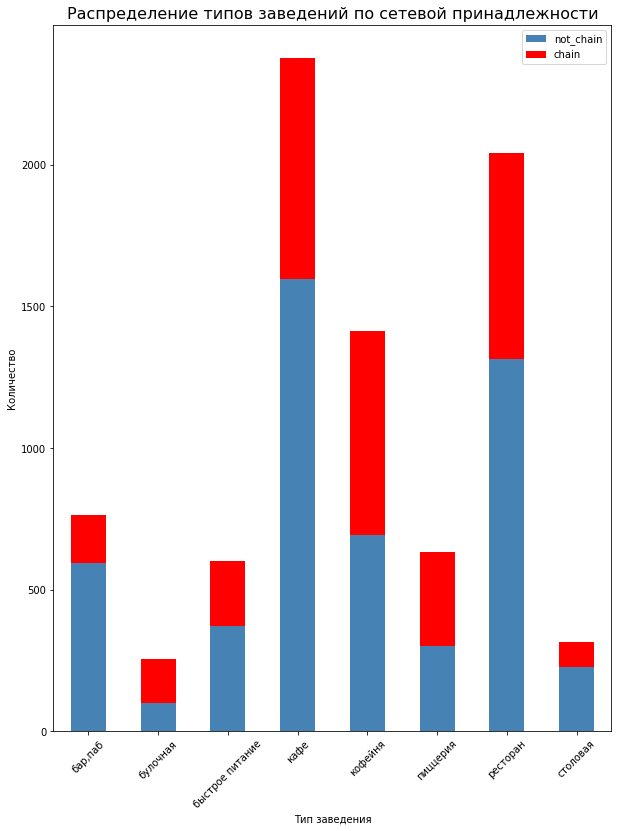

In [31]:
#формирование графика
plt.figure(figsize=(10,10))
ms_ch_i.set_index(ms_ch_i.index).plot(kind='bar', stacked= True , color=['steelblue', 'red'], figsize=(10, 13))

plt.title('Распределение типов заведений по сетевой принадлежности', fontsize= 16 )


plt.xlabel('Тип заведения')
plt.ylabel('Количество')

#rotate x-axis labels
plt.xticks (rotation= 45 )
plt.show()

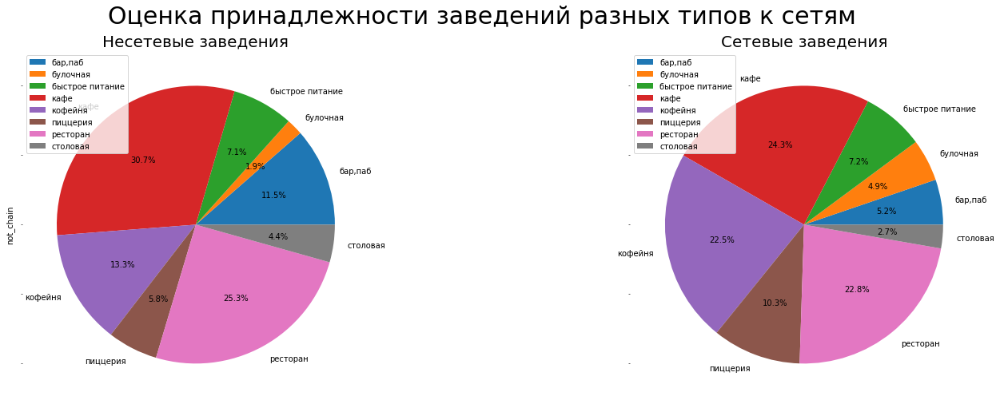

In [32]:
#формирование двух круговых диаграмм
fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(25,8))
ms_ch_i.plot(y='not_chain', kind='pie', autopct='%1.1f%%', ax=ax[0])
ms_ch_i.plot(y='chain', kind='pie', autopct='%1.1f%%', ax=ax[1])
ax[0].set_title("Несетевые заведения", fontsize=20)
ax[1].set_title("Сетевые заведения", fontsize=20)

fig.suptitle('Оценка принадлежности заведений разных типов к сетям', fontsize=30)

plt.show()

Всего сетевых заведений 38,1% среди всех записей. 
Можно сделать вывод, что чаще всего сетевыми являются кофейни, булочные и пиццерии. Доля сетевых баров ниже, чем несетевых. Рестораны и кафе чаще открываются как самостоятельные заведения, что связано с тем, что эти форматы сложнее стандартизировать из-за специфики - клиентам интересна индивидуальность места.
При этом, заведений быстрого питания примерно одинаково как 
Всего сетевых заведений в 1,5 раз меньше, чем несетевых.

#### Формирование топ-15 сетевых заведений города

Изучим, какие сети являеются наиболее популяными в Москве.

In [33]:
#формирование среза данных с записями о сетевых заведениях

chain_r=ms[ms['chain'] == 1]

In [34]:
#формирование сводной таблицы по количеству заведений в сети

top_ch=chain_r.groupby(['name']).agg(count = ('address', 'count')).sort_values(by = 'count', ascending=False)[:15]

top_ch

,count
name,
шоколадница,120
домино'с пицца,76
додо пицца,74
one price coffee,71
яндекс лавка,69
cofix,65
prime,50
хинкальная,44
кофепорт,42


Наиболее распространены по Москве такие сети, как Шоколадница, Домино'с пицца и додо пицца. 
Отобразим графически число точек каждой из наиболее популярных сетей.

In [35]:
fig = px.bar(top_ch, x=top_ch.index, y='count', title='Число точек сетевых организаций')
fig.update_xaxes(tickangle=45)
fig.show()

Наиболее популярной является сеть Шоколадница, число точек которой более 100.

Оценим, к каким категориям относятся сетевые заведения

In [36]:
#вывод списка названий наиболее популярных сетей
top_ch_n=top_ch.index

In [37]:
#вывод списка категорий
pd.DataFrame(chain_r.query('name in @top_ch_n').groupby('name')['category'].unique())

,category
name,
cofefest,"[кофейня, кафе]"
cofix,[кофейня]
one price coffee,[кофейня]
prime,"[ресторан, кафе]"
буханка,"[булочная, кофейня, кафе]"
додо пицца,[пиццерия]
домино'с пицца,[пиццерия]
кофепорт,[кофейня]
кулинарная лавка братьев караваевых,[кафе]


Как мы видим, наиболее распространенные сетевые заведения являются кофейнями, пиццерями. Тип заведения во многом объединяет популярные сети.
Наиболее распространены заведения типа кофейни (Шоколадница) и пиццерия (Домино'с пицца и додо), с ними будет сложно конкурировать на рынке. 
У разных точек сети разные категории, что может быть связано с разными используемыми форматами работы. 

#### Распределение заведений по районам Москвы

Ранее мы уже выяснили, что в датасете представлены записи о заведениях из 9 округов Москвы, а именно из северного административного округа, северо-восточного административного округа, северо-западного административного округа, западного административного округа, центрального административного округа, восточного административного округа, юго-восточного  административныого округа, южного административного округа, юго-западного административного округа.
Большая часть заведений работает в центральном административном округе.

Отразим распределение числа заведений по районам на диаграмме в целом и с разбивкой по категориям

In [38]:
#формирование сводной таблицы с распределением заведений по районам
ms_dist=ms.pivot_table(index='district', values='address', aggfunc='count').sort_values(by='address', ascending=False)
ms_dist.columns = ['count']
ms_dist

,count
district,
центральный административный округ,2242
северный административный округ,898
южный административный округ,892
северо-восточный административный округ,890
западный административный округ,850
восточный административный округ,798
юго-восточный административный округ,714
юго-западный административный округ,709
северо-западный административный округ,409


In [39]:
#круговая диаграмма распределения заведений по районам
fig = go.Figure(data=[go.Pie(labels=ms_dist.index, values=ms_dist['count'])])
fig.update_layout(title='Распределение заведений по районам')          
fig.show() 

In [40]:
#формирование сводной таблицы распределения заведений по категориям
ms_dist_c=ms.pivot_table(index='district', columns='category', values='address', aggfunc='count')
ms_dist_c

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
восточный административный округ,53,25,71,272,105,72,160,40
западный административный округ,50,37,62,238,150,71,218,24
северный административный округ,68,39,58,234,193,77,188,41
северо-восточный административный округ,62,28,82,269,159,68,182,40
северо-западный административный округ,23,12,30,115,62,40,109,18
центральный административный округ,364,50,87,464,428,113,670,66
юго-восточный административный округ,38,13,67,282,89,55,145,25
юго-западный административный округ,38,27,61,238,96,64,168,17
южный административный округ,68,25,85,264,131,73,202,44


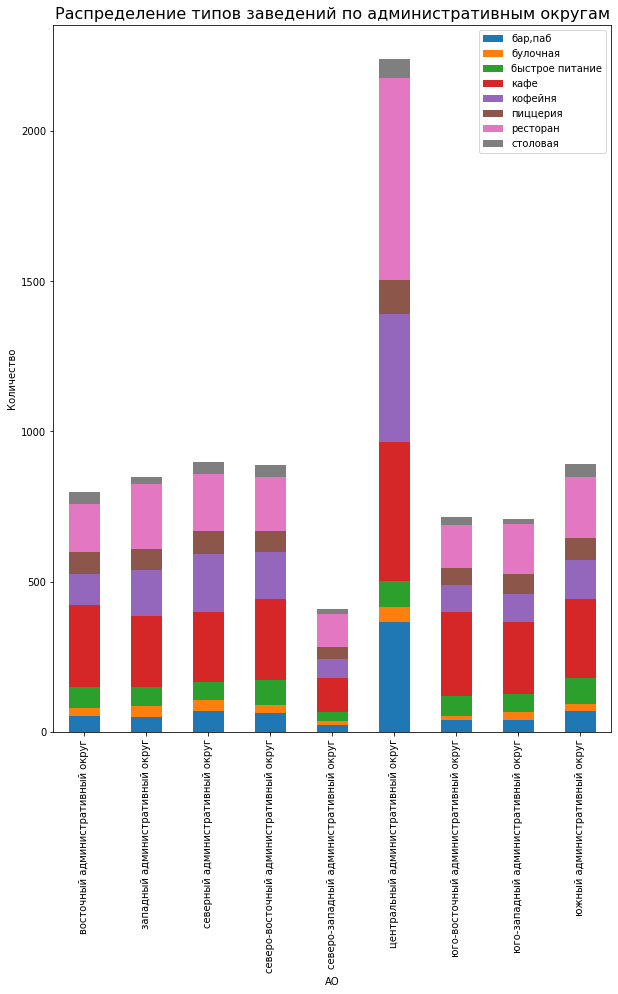

In [41]:
#формирование графика распределения заведений разных типов по АО

ms_dist_c.set_index(ms_dist_c.index).plot(kind='bar', stacked= True, figsize=(10, 13) )
plt.title('Распределение типов заведений по административным округам', fontsize= 16 )


plt.xlabel('АО')
plt.ylabel('Количество')
plt.legend(loc=0)

plt.show()

<div class="alert alert-success">
<b>Комментарий ревьюера:</b>☀️

Рекомендовал бы при наличии длинных подписей просто поворачивать график, чтобы административные округа располагались по оси `y`</div>

26,7% заведений располагается в Центральном административном округе, около 10% заведений в Северном, Южном, Северо-восточном, Западном административных округах.
Меньше всего заведений открыто в Северо-западном административном округе
В центральном административном округе наблюдается максимальное число кафе, баров, кофеен и ресторанов. В остальных округах число заведений данных видов значительно ниже.
Если рассматривать вариант расположения новой точки, то стоит обратить внимания на менее конкурентные районы, в которых число заведений примерно одинаково. 
Сильно из общей картины выбивается северо-восточный административный округ, возможно, это связано с тем, что в округе в основном располагаются спальные районы, не так много офисных объектов, как в иных округах, из-за чего проходимость ниже и меньше свободных площадей под аренду.

#### Изучение средних рейтингов заведений

Рассмотрим, как изменяется средний рейтинг заведений по округам и типам заведения. Для анализа будем использовать усредненные значения рейтингов

In [42]:
#формирование сводной таблицы с рейтингами по округам

ms_r_d=ms.pivot_table(index='district', values='rating', aggfunc='mean').sort_values(by='rating', ascending=False)
ms_r_d

,rating
district,
центральный административный округ,4.38
северный административный округ,4.24
северо-западный административный округ,4.21
южный административный округ,4.18
западный административный округ,4.18
восточный административный округ,4.17
юго-западный административный округ,4.17
северо-восточный административный округ,4.15
юго-восточный административный округ,4.10


In [43]:
#вывод графика для сравнительной оценки среднего рейтинга по округам
fig = px.bar(ms_r_d, x=ms_r_d.index, y='rating', title='Средний рейтинг заведений по округам')
fig.update_xaxes(tickangle=45)
fig.show()

Как мы видим, средний рейтинг заведений отличается незначительно. Минимальные оценки получили заведения в Юго-восточном АО, но и в нем заведения в среднем оцениваются выше оценки 4 из 5. 
Максимальный рейтинг у заведений в Центральном АО, скорее всего, это связано со стимулирующим влиянием жесткой конкуренции, заставляющим владельцев обеспечивать максимальное качество услуг.

Оценим средний рейтинг заведений разных типов.

In [44]:
#формирование сводной таблицы с рейтингами по категориям

ms_r_c=ms.pivot_table(index='category', values='rating', aggfunc='mean').sort_values(by='rating', ascending=False)
ms_r_c

,rating
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


In [45]:
#вывод графика для сравнительной оценки среднего рейтинга по категориям
fig = px.bar(ms_r_c, x=ms_r_c.index, y='rating', title='Средний рейтинг заведений по категориям')
fig.update_xaxes(tickangle=45)
fig.show()

Выше всего пользователи оценивают качество услуг в барах, скорее всего, это связано с лояльностью аудитории баров, отсутствием завышенных ожиданий к сервису. Также высоко оценивают услуги пиццерий, которые достаточно часто работают как часть сети и у сотрудников есть четкие инструкции по работе, соблюдение которых позволяет обеспечивать хороший уровень сервиса.
Наименьшие оценки в среднем получают заведения быстрого питания, это может быть связано с тем, что качество блюд в данных местах обеспечить на должном уровне на постоянной основе не всегда удается, из-за чего и снижаются баллы. 
Стоит отметить, что заведения всех типов в среднем оцениваются посетителями на хорошие оценки. 

Дополнительно проанализируем медианные показатели рейтингов. Возможно, наличие большого числа не всегда честных положительных отзывов могло исказить картину по среднему баллу.

In [46]:
#формирование сводной таблицы с медианными рейтингами по округам

ms_r_dm=ms.pivot_table(index='district', values='rating', aggfunc='median').sort_values(by='rating', ascending=False)
ms_r_dm

,rating
district,
центральный административный округ,4.40
восточный административный округ,4.30
западный административный округ,4.30
северный административный округ,4.30
северо-западный административный округ,4.30
юго-западный административный округ,4.30
южный административный округ,4.30
северо-восточный административный округ,4.20
юго-восточный административный округ,4.20


In [47]:
#вывод графика для сравнительной оценки среднего рейтинга по округам
fig = px.bar(ms_r_dm, x=ms_r_dm.index, y='rating', title='Медианный рейтинг заведений по округам')
fig.update_xaxes(tickangle=45)
fig.show()

In [48]:
#формирование сводной таблицы с медианными рейтингами по категориям

ms_r_cm=ms.pivot_table(index='category', values='rating', aggfunc='median').sort_values(by='rating', ascending=False)
ms_r_cm

,rating
category,
"бар,паб",4.40
булочная,4.30
кофейня,4.30
пиццерия,4.30
ресторан,4.30
столовая,4.30
быстрое питание,4.20
кафе,4.20


In [49]:
#вывод графика для сравнительной оценки медианного рейтинга по категориям
fig = px.bar(ms_r_cm, x=ms_r_cm.index, y='rating', title='Медианный рейтинг заведений по категориям')
fig.update_xaxes(tickangle=45)
fig.show()

В целом, картина по медианному рейтингу по округам даже лучше, чем по среднему баллу - минимальный медианный рейтинг составляет 4,2 и он соответствует заведениям северо-восточного АО и юго-восточного АО.
По заведениям в лидерах по-прежнему бары, худший медианный рейтинг у кафе и ресторанов быстрого питания, что также соответствует результатам оценки среднего рейтинга.

#### Оценка распределения заведений на карте Москвы

Оценим расположение заведений на карте, используя возможности встроенных библиотек python. 

In [50]:
#задание функции для загрузки карты Москвы

def map(data, group, column, agg, title):
    rating_df = data.groupby(group, as_index=False)[column].agg(agg)
    
    
    state_geo = 'admin_level_geomap.geojson'
    # ms_lat - широта центра Москвы, ms_lng - долгота центра Москвы
    ms_lat, ms_lng = 55.751244, 37.618423
    
    
    m = Map(location=[ms_lat, ms_lng], zoom_start=10)
    
    # создаём хороплет 
    Choropleth(
        geo_data=state_geo,
        data=rating_df,
        columns=[group, column],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title,
    ).add_to(m)
    
    # вывод карты
    return m

In [51]:
# координаты центра Москвы
ms_lat, ms_lng = 55.751244, 37.618423
#  карта Москвы
map_m = Map(location=[ms_lat, ms_lng], zoom_start=10)

In [52]:
#вывод заведений на карту
# создаём карту Москвы
map_m = Map(location=[ms_lat, ms_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_m)

# функция для создания маркера для каждой из записи в датасете
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",
    ).add_to(marker_cluster)

# применение функции
ms.apply(create_clusters, axis=1)

# выводим карту
map_m

Как мы видим, по разным районам города находится разное число заведений. Чем ближе к центру, тем их больше. Это объясняется тем, что в Центральном АО располагется множество офисных объектов, туристических мест, то есть, обеспечивается хорошая проходимость мест, есть интерес к посещению точек питания.
Отдельные точки на карте отображают заведения в отдаленных районах, например, рядом с МКАД. При увеличении карты возможно оценить расположение объектов и их плотность в интересующем районе города.

#### Формирование топа улиц по насыщенности заведениями

Оценим, на каких улицах чаще всего открывают точки общественного питания.

In [53]:
#формирование сводной таблицы по количеству заведений на улице

top_str=ms.groupby(['street']).agg(count = ('address', 'count')).sort_values(by = 'count', ascending=False)[:15]

top_str

,count
street,
проспект мира,183
профсоюзная улица,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
дмитровское шоссе,88
каширское шоссе,77
варшавское шоссе,76
ленинградское шоссе,70


In [54]:
#вывод столбчатой диаграммы с распределением заведений по улицам

fig = px.bar(top_str, x=top_str.index, y='count', title='Число заведений по улицам')
fig.update_xaxes(tickangle=45)
fig.show()

In [55]:
#вывод списка названий улиц, где заведений больше всего
top_str_n=top_str.index

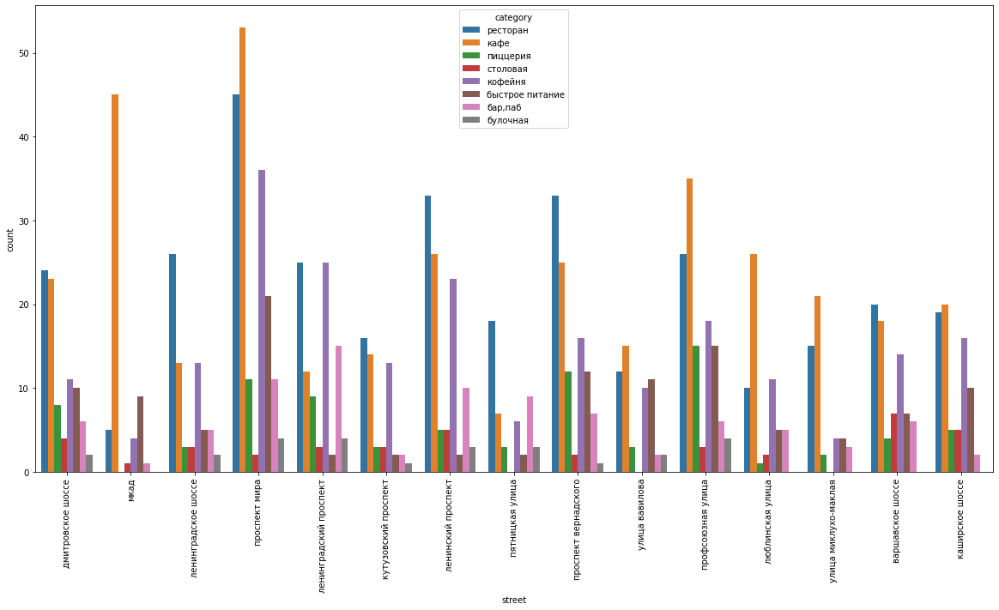

In [56]:
#вывод датасета с записями о заведениях на самых заполненных улицах
top_str_name=ms.query('street in @top_str_n')

#формирование графика распределения категорий заведений по улицам из топ-15 улиц

plt.figure(figsize=(20, 10))
sns.countplot(x='street', hue='category', data=top_str_name)
plt.xticks(rotation=90)
plt.show()

Наибольшее число заведений открыто на проспекте Мира, больше всего там кафе и ресторанов. 
На втором месте по числу кафе располагается МКАД, число кафе на которой в несколько раз превышает число заведений иных типов. Причиной высокого числа заведений на данной улице можно считать ее длину, которая превышает длины проспектов Мира, Вернадского и Ленинского.
По числу ресторанов лидируют проспект Вернадского, Ленинский проспект.
Наиболее плотно заведения общественного питания расположены на проспекте Мира, Профсоюзной улицы, проспекте Вернадского, Ленинском проспекте

Сформируем и своеобразный антитоп улиц по насыщенности заведениями. В него попадут улицы, где заведение всего 1.

In [57]:
#формирование сводной таблицы по количеству заведений на улице

one_str=ms.groupby(['street']).agg(count = ('address', 'count')).query('count==1')

one_str.count()


count    457
dtype: int64

In [58]:
#вывод списка улиц
one_str_name=one_str.index

#формирование датасета с информацией по таким улицам
one_str_n=ms.query('street in @one_str_name')

Изучим информацию о заведениях, которые располагаются по одному на улице. Оценим их тип, расположение по районам.

In [59]:
#формирование сводной таблицы по распределению заведений, которых на улице по одному, по АО

one_str_dist=one_str_n.groupby(['district']).agg(count = ('address', 'count')).sort_values(by = 'count', ascending=False)

#вывод столбчатой диаграммы с распределением заведений, которых на улице по одному, по АО

fig = px.bar(one_str_dist, x=one_str_dist.index, y='count', title='Число заведений-одиночек по районам')
fig.update_xaxes(tickangle=45)
fig.show()

In [60]:
#формирование сводной таблицы по среднего рейтинга заведений по районам, которых на улице по одному

one_str_rat=one_str_n.pivot_table(index='district', values='rating', aggfunc='mean').sort_values(by='rating', ascending=False)

#вывод столбчатой диаграммы распределения среднего рейтинга заведений по районам, которых на улице по одному

fig = px.bar(one_str_rat, x=one_str_rat.index, y='rating', title='Рейтинг заведений-одиночек')
fig.update_xaxes(tickangle=45)
fig.show()

In [61]:
#формирование сводной таблицы по типам заведений, которых на улице по одному

one_str_cat=one_str_n.groupby(['category']).agg(count = ('address', 'count')).sort_values(by = 'count', ascending=False)

#вывод столбчатой диаграммы с распределением по типам заведений, которых на улице по одному

fig = px.bar(one_str_cat, x=one_str_cat.index, y='count', title='Число заведений-одиночек по типам')
fig.update_xaxes(tickangle=45)
fig.show()

Больше всего среди заведений-одиночек кафе, их средний рейтинг не ниже 4 баллов по всем районам. Заведения можно найти во всех АО города. Возможно, их малое количество на улице связано с малой длиной улицы и отсутствием мест для аренды.

#### Оценка динамики среднего чека по районам города

Проанализируем, как удаленность от центра влияет на средний чек в заведении

In [62]:
#сводная таблица с оценкой среднего чека по АО
ms_bill=ms.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').sort_values(by='middle_avg_bill', ascending=False)
ms_bill

,middle_avg_bill
district,
западный административный округ,1000.00
центральный административный округ,1000.00
северо-западный административный округ,700.00
северный административный округ,650.00
юго-западный административный округ,600.00
восточный административный округ,575.00
северо-восточный административный округ,500.00
южный административный округ,500.00
юго-восточный административный округ,450.00


In [63]:
map(ms, 'district', 'middle_avg_bill', 'median', 'Медианные стоимости заказа в рублях')

Дороже всего посетить заведение в центральном и западном АО. При удалении от центра средний чек постепенно снижается

#### Оценка типов круглосуточных заведений

Оценим, какие типы заведений чаще всего работают 24/7, где такие заведения расположены

In [64]:
#формирование сводной таблицы для оценки доли круглосуточных заведений
ft=ms.pivot_table(index='is_24/7', values='name', aggfunc='count')
ft.columns=['count']
ft

,count
is_24/7,
False,7137
True,730


In [65]:
#вывод круговой диаграммы для оценки доли круглосуточных заведений

fig = go.Figure(data=[go.Pie(labels=ft.index, values=ft['count'])])
fig.update_layout(title='Доля круглосуточных заведений')          
fig.show() 

In [66]:
#вывод датасета с круглосуточными заведениями

full_time=ms.loc[ms['is_24/7']==True, :]
#формирование сводной таблицы для оценки типа заведения
full_time_p=full_time.pivot_table(index='category', values='name', aggfunc='count')


#вывод графика для оценки типов круглосуточных заведений
fig = px.bar(full_time_p, x=full_time_p.index, y='name', title='Типы круглосуточных заведений')
fig.update_xaxes(tickangle=45)
fig.show()

In [67]:
#формирование сводной таблицы для оценки расположения круглосуточных заведений
full_time_d=full_time.pivot_table(index='district', values='name', aggfunc='count')


#вывод графика для оценки типов круглосуточных заведений
fig = px.bar(full_time_d, x=full_time_d.index, y='name', title='Расположение круглосуточных заведений')
fig.update_xaxes(tickangle=45)
fig.show()

Круглосуточно работет всего 9% заведений, записи о которых представлены в датасете. Чаще всего это кафе и рестораны

#### Вывод по разделу

Были проанализированы сведения о заведениях общественного питания в городе Москва.
1) Больше всего в городе функционирует кафе и ресторанов
2) Максимальная концентрация заведений отмечается в Центральном АО, меньше всего их в Северо-Западном АО
3) Большее число посадочных мест в ресторанах и барах, меньше в булочных
4) Всего 38% заведений относятся к сетевым, чаще всего это кофейни и пиццерии. Самыми распространенными сетями являются Шоколадница, Домино'с пицца и додо пицца. Рестораны и кафе чаще всего открываются как самостоятельные заведения и не являются сетевыми
5) Средний рейтинг всех заведений не понижается ниже отметки 4
6) Наибольшее число заведений отмечается на проспекте Мира, Профсоюзной улицы, проспекте Вернадского, Ленинском проспекте.
7) Около 487 заведений располагаются по одному на улице
8) Дороже всего сходить поесть в Центральном и Западном АО. При удаленности от центра средний чек снижается
9) Чаще всего круглосуточно работают кафе и рестораны. Больше всего круглосуточных заведений в Центральном АО. Всего круглосуточных заведений около 9%

### Оценка конкурентной среды для кофейни

Одной из задач исследования являлась оценка возможности выхода на рынок новой кофейни. Проанализируем конкурентную ситуацию и оценим, насколько велики шансы успешно запустить бизнес

Будем работать со срезом из начального набора данных, который содержит записи о кофейнях.

In [68]:
#формирование датасета для работы
coffee=ms.query('category =="кофейня"')
#вывод числа кофеен по городу
print('Всего в Москве открыто кофеен:', coffee.shape[0] )

Всего в Москве открыто кофеен: 1413


#### Расположение кофеен

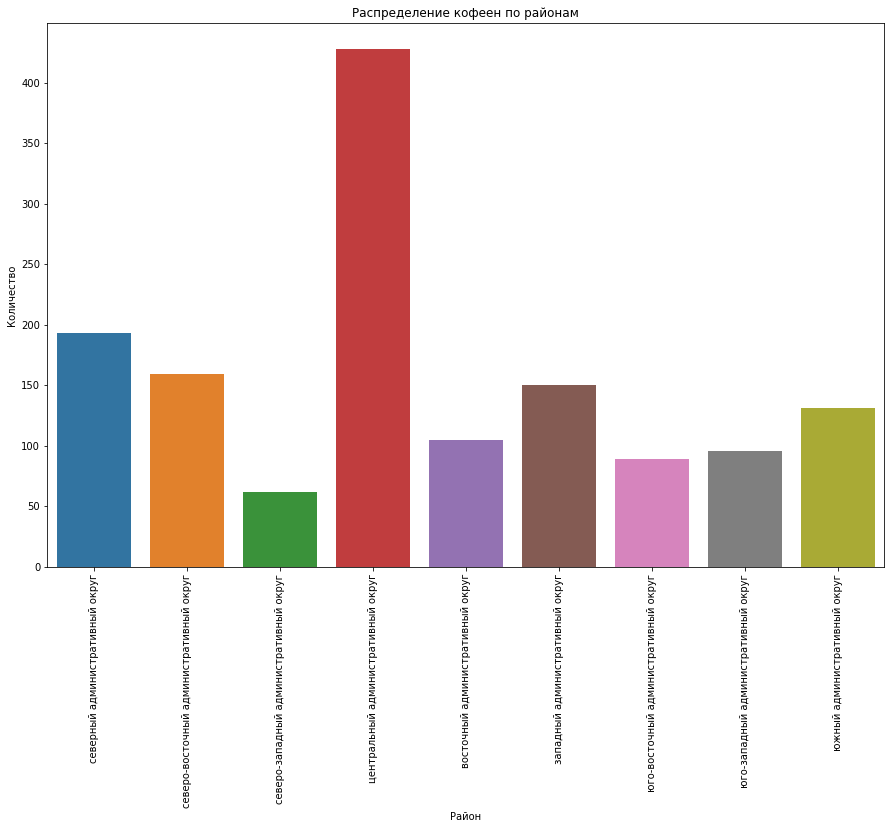

In [69]:
#оценка расположения кофеен по районам города
plt.figure(figsize=(15, 10))
sns.countplot(x='district', data=coffee)
plt.xticks(rotation=90)
plt.xlabel('Район')
plt.ylabel('Количество')
plt.title('Распределение кофеен по районам')
plt.show()

Оценим расположение кофеен на карте

In [70]:
map(ms, 'district', 'name', 'count', 'Кофейни на карте города')

Больше всего кофеен в Центральном АО, значительно меньше в Северном АО и иных районах города

При выборе локации следует рассмотреть более отдаленные от центра районы, так как в них конкуренция будет ниже. Стоит также изучить инфраструктуру района и выбрать место рядом с офисными центрами, учебными заведениями, больницами, так как рядом с такими объектами проходимость выше. Не стоит рассматривать расположение рядом с торговыми центрами, так как в них обычно уже открыты кофейни. 

#### Оценка режимов работы кофеен

Проанализируем, есть ли среди кофеен круглосуточные

In [71]:
#оценка числа круглосуточных кофеен

coffee_r= coffee.pivot_table(index='is_24/7', values='name', aggfunc='count')
coffee_r

,name
is_24/7,
False,1339
True,59


In [72]:
#вывод круговой диаграммы с распределением кофеен по режимам работы

fig = go.Figure(data=[go.Pie(labels=coffee_r.index, values=coffee_r['name'])])
fig.update_layout(title='Доля круглосуточных кофеен')          
fig.show() 

Всего в Москве функционирует 59 круглосуточные кофейни (4,22% от общего числа).
Изучим, в каких районах данные кофейни располагаются.

In [73]:
#формирование таблицы с распределением кофеен по АО по условию их режима работы

coffee_rd=coffee.pivot_table(index='district', columns='is_24/7', values='name', aggfunc='count')

coffee_rd

is_24/7,False,True
district,,
восточный административный округ,97,5
западный административный округ,139,9
северный административный округ,186,5
северо-восточный административный округ,154,3
северо-западный административный округ,60,2
центральный административный округ,400,26
юго-восточный административный округ,87,1
юго-западный административный округ,87,7
южный административный округ,129,1


<Figure size 720x720 with 0 Axes>

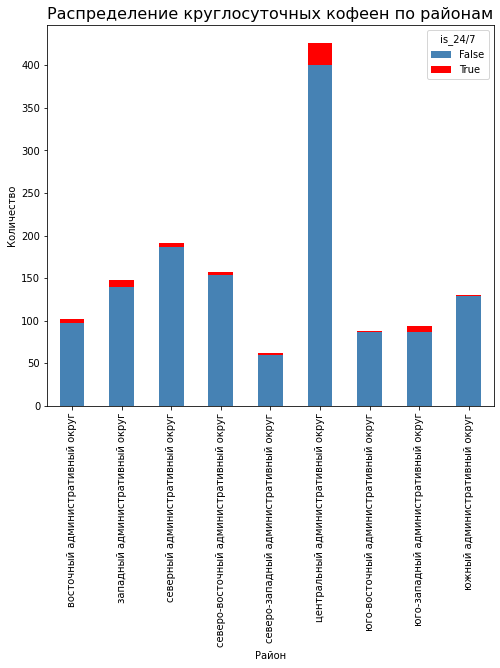

In [74]:
#формирование графика
plt.figure(figsize=(10,10))
coffee_rd.set_index(coffee_rd.index).plot(kind='bar', stacked= True , color=['steelblue', 'red'], figsize=(8, 7))

plt.title('Распределение круглосуточных кофеен по районам', fontsize= 16 )


plt.xlabel('Район')
plt.ylabel('Количество')

#rotate x-axis labels
plt.xticks (rotation= 90 )
plt.show()

Большее число круглосуточных кофеен располагается в Центральном АО, где проходимость выше в любое время суток, а также выше конкуренция, поэтому ряд заведений стремятся увеличить свои шансы на успех на рынке путем перехода на круглосуточный режим работы.
В остальных районах число круглосуточных заведений не превышает 10.
Скорее всего, содержать круглосуточную точку в отдалении от центра или вокзалов не очень целесообразно.

#### Оценка рейтингов кофеен по районам

Проанализируем, какие баллы ставили посетители кофейням. 

In [75]:
#оценка общего рейтинга кофеен

coffee['rating'].describe()

count   1413.00
mean       4.28
std        0.37
min        1.40
25%        4.10
50%        4.30
75%        4.40
max        5.00
Name: rating, dtype: float64

Минимальная оценка для кофейни - 1,4. Очевидно, там все не очень по уровню сервиса и качеству сырья. 
В среднем, кофейни получают оценки выше 4 баллов, то есть, большую часть 
Рассмотрим распределение оценок по районам.

In [76]:
#формирование сводной таблицы с рейтингами кофеен по районам
coffee_rd=coffee.pivot_table(index='district', values='rating', aggfunc=['min', 'mean', 'median', 'max'])
coffee_rd.columns=['min', 'mean', 'median', 'max']
coffee_rd

,min,mean,median,max
district,,,,
восточный административный округ,3.00,4.28,4.30,5.00
западный административный округ,2.30,4.20,4.20,5.00
северный административный округ,2.00,4.29,4.30,5.00
северо-восточный административный округ,1.40,4.22,4.30,5.00
северо-западный административный округ,2.00,4.33,4.30,5.00
центральный административный округ,2.30,4.34,4.30,5.00
юго-восточный административный округ,2.30,4.23,4.30,5.00
юго-западный административный округ,3.30,4.28,4.30,5.00
южный административный округ,2.00,4.23,4.30,5.00


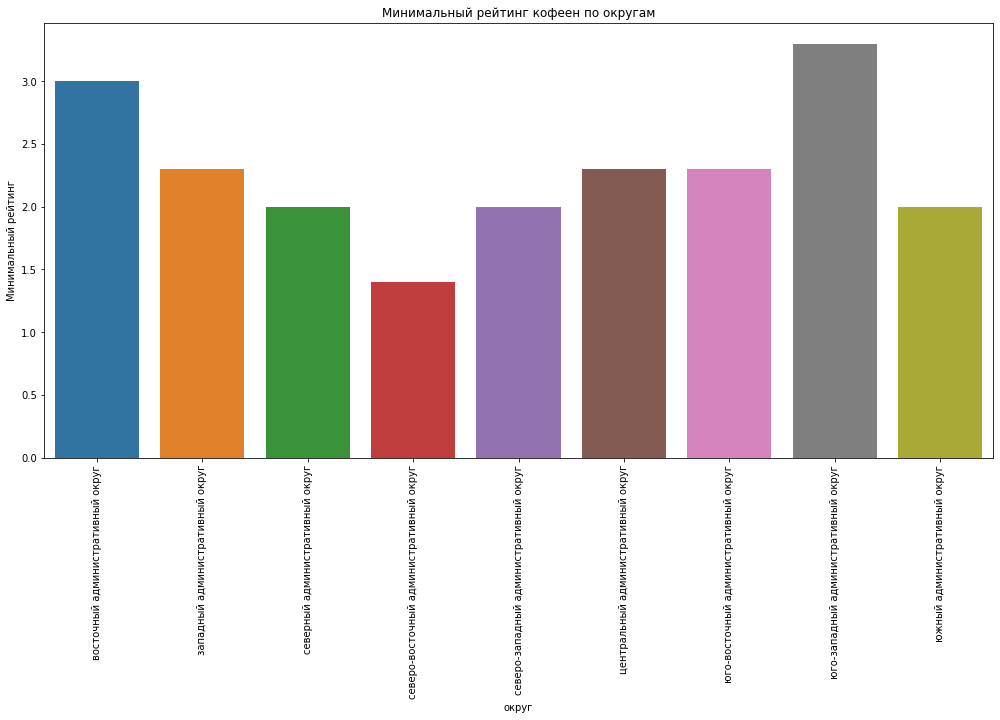

In [77]:
#оценка минимального рейтинга по округам

plt.figure(figsize=(17, 8))
sns.barplot(data=coffee_rd, x=coffee_rd.index, y="min")
plt.title('Минимальный рейтинг кофеен по округам')
plt.xlabel('округ')
plt.ylabel('Минимальный рейтинг')
plt.xticks (rotation= 90 )
plt.show()

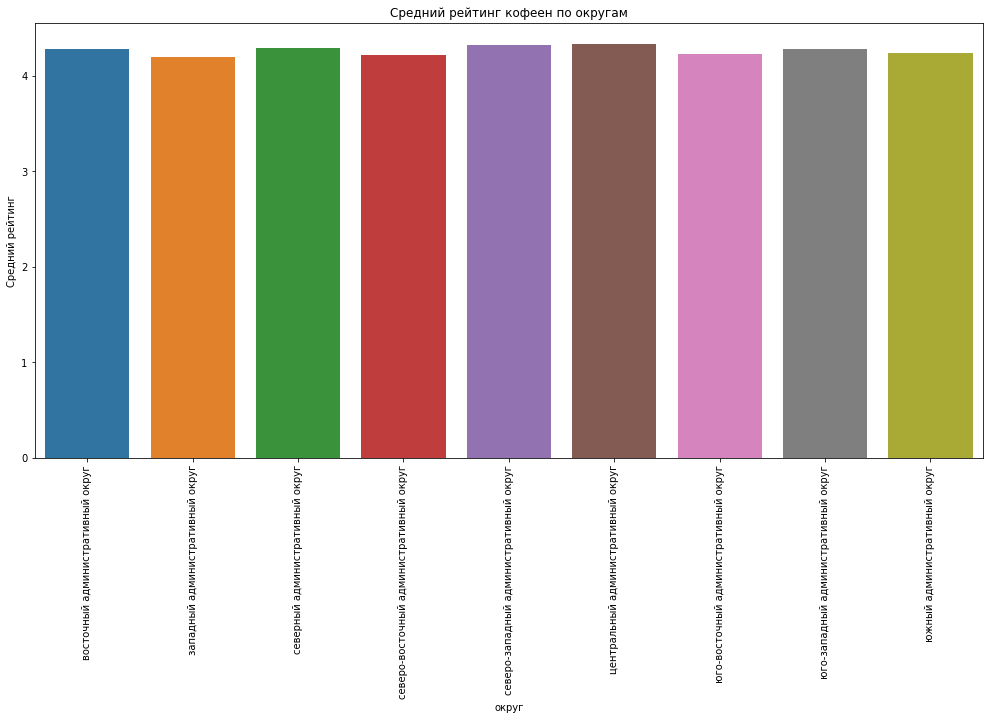

In [78]:
#оценка среднего рейтинга по округам

plt.figure(figsize=(17, 8))
sns.barplot(data=coffee_rd, x=coffee_rd.index, y="mean")
plt.title('Средний рейтинг кофеен по округам')
plt.xlabel('округ')
plt.ylabel('Средний рейтинг')
plt.xticks (rotation= 90 )
plt.show()

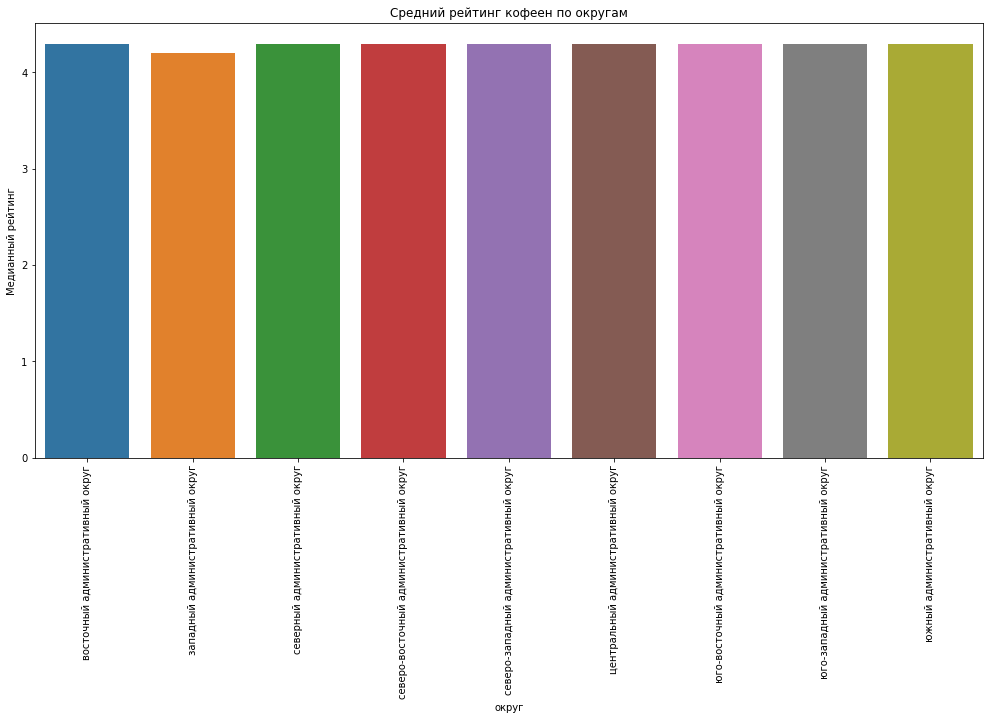

In [79]:
#оценка медианного рейтинга по округам

plt.figure(figsize=(17, 8))
sns.barplot(data=coffee_rd, x=coffee_rd.index, y="median")
plt.title('Средний рейтинг кофеен по округам')
plt.xlabel('округ')
plt.ylabel('Медианный рейтинг')
plt.xticks (rotation= 90 )
plt.show()

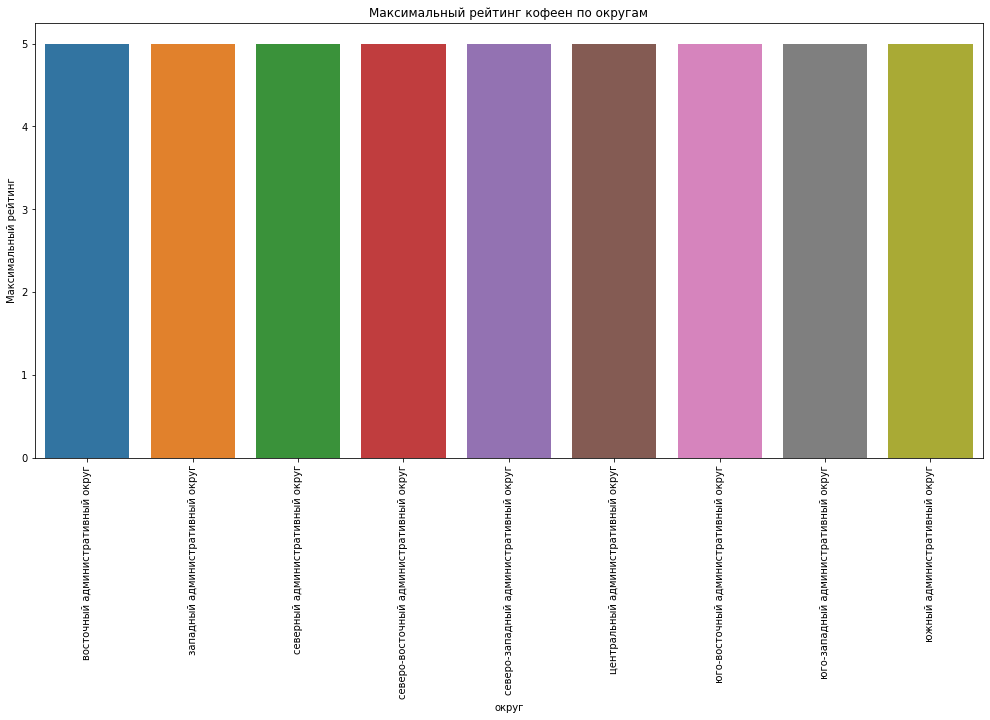

In [80]:
#оценка максимального рейтинга по округам

plt.figure(figsize=(17, 8))
sns.barplot(data=coffee_rd, x=coffee_rd.index, y="max")
plt.title('Максимальный рейтинг кофеен по округам')
plt.xlabel('округ')
plt.ylabel('Максимальный рейтинг')
plt.xticks (rotation= 90 )
plt.show()

Было отмечено, что в северо-восточном АО располагается кофейня, получившая наименьшие оценки от пользователей. Лучшие практики работы применяют в кофейнях в юго-западном административном округе, при заходе в рынок этого АО шансов на раскачку не будет и необходимо изначально показывать высокое качество оказываемых услуг для того, чтобы выдержать конкуренцию. 
В северо-восточном АО кофейни имеют наихудший рейтинг, в этом районе можно зайти на рынок, предложив более качественную альтернативу имеющемуся. 
В целом, средние и медианные оценки кофеен выше 4 баллов во всех округах. Также во всех округах функционируют кофейни с максимальным рейтингом

#### Оценка стоимости чашки кофе

Для того, чтобы оценить, какую стоимость за чашку кофе заявить при отрытии, стоит оценить, сколько сейчас готовы платить клиенты в разных АО.
Для этого оценим распределение средней стоимости чашки кофе в целом и с разбивкой по районам.

In [81]:
coffee['middle_coffee_cup'].describe()

count    521.00
mean     175.06
std       89.75
min       60.00
25%      124.00
50%      170.00
75%      225.00
max     1568.00
Name: middle_coffee_cup, dtype: float64

In [82]:
coffee['middle_coffee_cup'].median()

170.0

Данные по средней стоимости кофе были представлены не по всем кофейням в наборе, поэтому в дальнейшем следует для более точного анализа изменить подходы к сбору данных.
Оценка имеющихся данных показала, что в среднем чашка кофе в Москве стоит 170 рублей, возможно варьировать цену от 124 до 170 рублей, так как всего 25% организаций в настоящее время продают кофе по цене ниже 124 рублей за чашку и при заходе на рынок возможно поставить эту цену при открытии (но необходимо первоначально оценить себестоимость продукции).

Оценим, как зависит стоимость чашки кофе от АО.

In [83]:
#оценка зависимости медианной стоимости чашки кофе от АО
coffee_dp=coffee.pivot_table(index='district', values='middle_coffee_cup', aggfunc=['min', 'mean', 'median', 'max'])
coffee_dp.columns=['min', 'mean', 'median', 'max']
coffee_dp

,min,mean,median,max
district,,,,
восточный административный округ,60.00,174.02,135.00,1568.00
западный административный округ,60.00,189.94,189.00,300.00
северный административный округ,60.00,165.79,159.00,325.00
северо-восточный административный округ,60.00,165.33,162.50,297.00
северо-западный административный округ,60.00,165.52,165.00,270.00
центральный административный округ,60.00,187.52,190.00,328.00
юго-восточный административный округ,60.00,151.09,147.50,375.00
юго-западный административный округ,95.00,184.18,198.00,291.00
южный административный округ,60.00,158.49,150.00,275.00


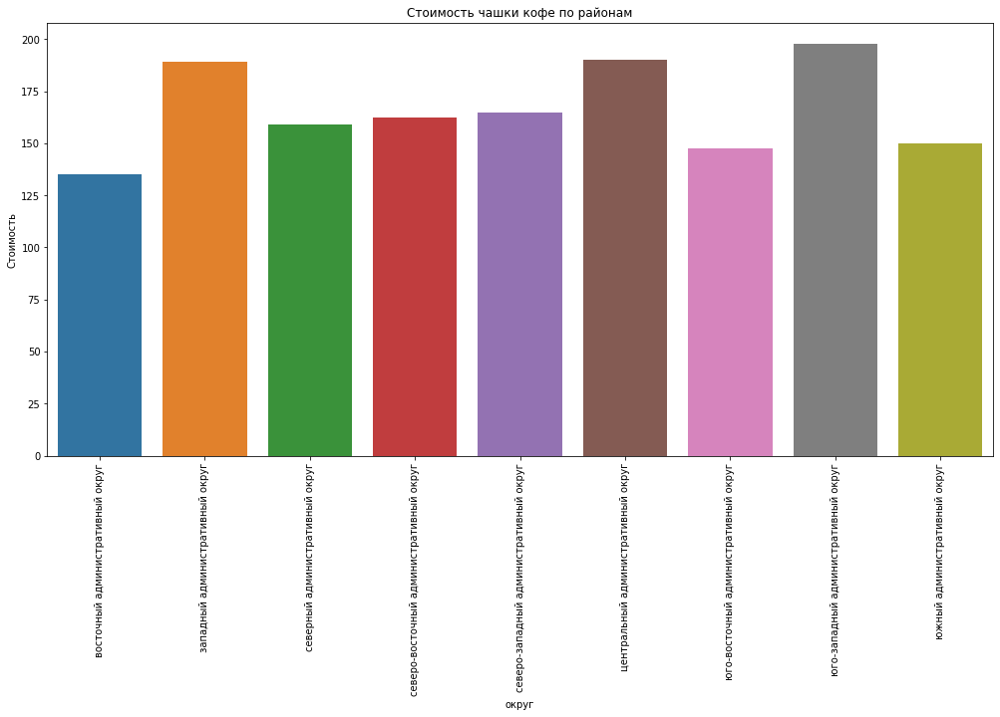

In [84]:
#оценка медианной стоимости чашки кофе от АО

plt.figure(figsize=(17, 8))
sns.barplot(data=coffee_dp, x=coffee_dp.index, y="median")
plt.title('Стоимость чашки кофе по районам')
plt.xlabel('округ')
plt.ylabel('Стоимость')
plt.xticks (rotation= 90 )
plt.show()

Дороже всего кофе продается в Центральном и Западном АО. Практически во всех округах можно купить кофе за 60 рублей,скорее всего, это стоимость в одном из сетевых заведений.
Наиболее низкая медианная стоимость чашки кофе наблюдается в Восточном АО, где она составляет 135 рублей

Общие выводы и рекомендации:
- В инвестиционном проекте по открытию кофейни есть смысл, так как в отдельных АО города рынок еще не насыщен подобными заведениями;
- Следует открывать кофейню в северном административном округе, северо-восточном административном округе,  восточном административном округе, юго-восточном  административном округе, южном административном округе. В данных районах конкуренция меньше, чем в центре, есть шанс занять нишу. Более детальные рекомендации по расположению возможно сформулировать при изучении инфраструктуры района;
- Нет особого смысла на старте открывать круглосуточную кофейню, формат работает только в центре, где уже рынок занят большим числом организаций. Не так много потребителей ночью испытывают потребность выпить кофе (и за ним клиент может зайти в круглосуточное кафе), особенно в незнакомом месте, а поддержание функционирования кофейни 24/7 может привести к значительным издержкам, которые на старте не отобьются
- Кофейни в северо-восточном АО сейчас обладают наиболее низким рейтингом, можно рассмотреть этот район в качестве места для открытия новой точки - при отсутствии конкурентов и демонстрации высокого качества услуг можно занять нишу
- Рекомендовано установить цену чашки кофе на старте около 130-150 рублей - это ниже медианной стоимости, может привлечь клиентов 

### Презентация
https://disk.yandex.ru/i/eFZIPTPGt4LT7A

### Итоги проекта

- Всего в Москве функционирует 8401 заведение общественного питания, наибольшую долю рынка занимают кафе, рестораны и кофейни;
- Наибольшая концентрация заведений отмечается в Центральном АО, остальные округа менее загружены и на них возможно разместить новое заведение;
- Наибольшей вместимостью обладают бары, рестораны и кафе. Для несетевой кофейни следует ориентироваться на число посадочных мест до 55
- Всего сетевых заведений 38,1%. Чаще всего сетевыми являются кофейни, булочные и пиццерии;
- Наиболее популярны такие сети, как Шоколадница и пиццерии Домино'с пицца и Додо пицца;
- Средний рейтинг заведений превышает  4 балла, лучшими рейтингами обладают рестораны и кофейни;
- Наибольшая концентрация заведений отмечается на проспекте Мира, Профсоюзной улице, проспекте Вернадского и проспекте Ленинского;
- Круглосуточный формат работы использует всего 9% заведений, обычно это кафе и рестораны. Число круглосуточных кофеен по АО редко превышает 10
- При открытии новой кофейни следует рассмотреть удаленные от центра районы, так как в них конкуренция ниже. Стоит уделить внимание 
- Цену за чашку кофе стоит установить в пределах 120-150 рублей
